<a href="https://colab.research.google.com/github/jaredmullane/CS68_Stanford_MachineLearning/blob/master/Jared_lending_club_hw_trees_starteripynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn import tree


In [ ]:
lc_data =  pd.read_csv('https://raw.githubusercontent.com/cjflanagan/cs68/master/lending_club_training_data_subset.csv')

In [ ]:
lc_data.dropna(axis=1, inplace=True) # Dropping NANs

In [ ]:
lc_data.head()

,Unnamed: 0,id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,purpose,zip_code,addr_state,delinq_2yrs,earliest_cr_line,fico_range_low,fico_range_high,inq_last_6mths,open_acc,pub_rec,revol_bal,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,...,open_act_il,open_il_12m,open_il_24m,total_bal_il,open_rv_12m,open_rv_24m,max_bal_bc,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,debt_settlement_flag
0,65230,92451797,26450.0,26450.0,26450.0,60 months,18.99%,685.99,D,D3,RENT,63000.0,Not Verified,Nov-2016,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,debt_consolidation,100xx,NY,2.0,Sep-2007,675.0,679.0,1.0,6.0,0.0,204.0,14.0,w,0.0,0.0,22329.530000,22329.53,9704.73,10188.98,0.0,2435.82,438.4476,1371.98,...,2.0,1.0,1.0,5951.0,2.0,2.0,133.0,7300.0,1.0,0.0,2.0,3.0,1026.0,0.0,0.0,110.0,6.0,5.0,0.0,0.0,2.0,2.0,4.0,6.0,6.0,4.0,7.0,2.0,6.0,0.0,1.0,3.0,66.7,0.0,0.0,18914.0,6155.0,7300.0,11614.0,N
1,36521,94187830,12000.0,12000.0,12000.0,36 months,11.44%,395.37,B,B4,RENT,85000.0,Source Verified,Nov-2016,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,debt_consolidation,786xx,TX,0.0,Aug-2008,680.0,684.0,0.0,11.0,0.0,12855.0,18.0,w,0.0,0.0,12458.596524,12458.60,12000.00,458.60,0.0,0.00,0.0000,11280.12,...,1.0,0.0,1.0,25831.0,3.0,4.0,3753.0,21700.0,0.0,7.0,0.0,5.0,3869.0,0.0,0.0,99.0,5.0,5.0,0.0,1.0,4.0,6.0,5.0,6.0,2.0,10.0,16.0,6.0,11.0,0.0,0.0,3.0,88.9,0.0,0.0,52683.0,38686.0,15000.0,30983.0,N
2,25712,93882482,1000.0,1000.0,1000.0,36 months,15.99%,35.16,C,C5,RENT,90000.0,Source Verified,Dec-2016,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,other,557xx,MN,0.0,Feb-1999,695.0,699.0,0.0,13.0,0.0,18157.0,27.0,w,0.0,0.0,1000.600733,1000.60,1000.00,0.60,0.0,0.00,0.0000,1002.38,...,3.0,1.0,1.0,44715.0,0.0,1.0,5980.0,18300.0,0.0,2.0,0.0,2.0,4836.0,0.0,0.0,213.0,23.0,10.0,0.0,0.0,8.0,8.0,8.0,10.0,16.0,9.0,11.0,9.0,13.0,0.0,0.0,1.0,100.0,0.0,0.0,56789.0,62872.0,17800.0,38489.0,N
3,92973,91238602,10000.0,10000.0,10000.0,36 months,10.99%,327.34,B,B4,RENT,40000.0,Verified,Oct-2016,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,credit_card,224xx,VA,0.0,May-2005,680.0,684.0,0.0,10.0,0.0,6771.0,32.0,f,0.0,0.0,11778.122232,11778.12,10000.00,1778.12,0.0,0.00,0.0000,327.33,...,1.0,0.0,0.0,19288.0,2.0,5.0,2300.0,15400.0,1.0,1.0,0.0,5.0,2895.0,0.0,0.0,122.0,4.0,4.0,2.0,0.0,4.0,5.0,5.0,10.0,14.0,9.0,15.0,5.0,10.0,0.0,0.0,2.0,93.5,0.0,0.0,42402.0,26059.0,7300.0,27002.0,N
4,16335,94465406,4500.0,4500.0,4500.0,36 months,26.24%,181.89,E,E5,RENT,30000.0,Verified,Dec-2016,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,other,322xx,FL,0.0,Feb-2012,660.0,664.0,1.0,7.0,1.0,2483.0,7.0,f,0.0,0.0,6534.574960,6534.57,4500.00,2034.57,0.0,0.00,0.0000,181.54,...,3.0,0.0,1.0,47856.0,1.0,3.0,236.0,4200.0,0.0,3.0,1.0,4.0,7191.0,0.0,0.0,31.0,2.0,2.0,0.0,1.0,1.0,4.0,1.0,1.0,3.0,4.0,4.0,4.0,7.0,0.0,0.0,1.0,85.7,0.0,0.0,54722.0,50339.0,300.0,50522.0,N


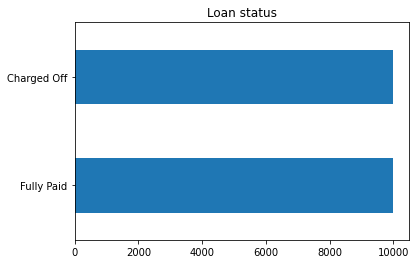

In [ ]:
lc_data.loan_status.value_counts().plot(kind='barh', title='Loan status')
plt.show() 

In [ ]:
lc_data.loan_status = lc_data.loan_status.replace({'Charged Off':1, 'Fully Paid':0})
y = lc_data.pop('loan_status')

In [ ]:
lc_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 89 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Unnamed: 0                  20000 non-null  int64  
 1   id                          20000 non-null  int64  
 2   loan_amnt                   20000 non-null  float64
 3   funded_amnt                 20000 non-null  float64
 4   funded_amnt_inv             20000 non-null  float64
 5   term                        20000 non-null  object 
 6   int_rate                    20000 non-null  object 
 7   installment                 20000 non-null  float64
 8   grade                       20000 non-null  object 
 9   sub_grade                   20000 non-null  object 
 10  home_ownership              20000 non-null  object 
 11  annual_inc                  20000 non-null  float64
 12  verification_status         20000 non-null  object 
 13  issue_d                     200

In [ ]:
categorical_cols = [
  'term',
 'int_rate',
 'sub_grade',
 'home_ownership',
 'verification_status',
 'debt_settlement_flag',
 'pymnt_plan']
categorical_cols

['term',
 'int_rate',
 'sub_grade',
 'home_ownership',
 'verification_status',
 'debt_settlement_flag',
 'pymnt_plan']

In [ ]:
numerical_columns = [
  'loan_amnt',
  'installment',
  'delinq_2yrs',
  'fico_range_low',
  'fico_range_high',
  'total_acc'
]
numerical_columns

['loan_amnt',
 'installment',
 'delinq_2yrs',
 'fico_range_low',
 'fico_range_high',
 'total_acc']

In [ ]:
lc_data_subset = lc_data[numerical_columns + categorical_cols]
lc_data_subset.head()

,loan_amnt,installment,delinq_2yrs,fico_range_low,fico_range_high,total_acc,term,int_rate,sub_grade,home_ownership,verification_status,debt_settlement_flag,pymnt_plan
0,26450.0,685.99,2.0,675.0,679.0,14.0,60 months,18.99%,D3,RENT,Not Verified,N,n
1,12000.0,395.37,0.0,680.0,684.0,18.0,36 months,11.44%,B4,RENT,Source Verified,N,n
2,1000.0,35.16,0.0,695.0,699.0,27.0,36 months,15.99%,C5,RENT,Source Verified,N,n
3,10000.0,327.34,0.0,680.0,684.0,32.0,36 months,10.99%,B4,RENT,Verified,N,n
4,4500.0,181.89,0.0,660.0,664.0,7.0,36 months,26.24%,E5,RENT,Verified,N,n


In [ ]:
# Create dummy variables
lc_data_subset = pd.get_dummies(data = lc_data_subset, columns=categorical_cols, drop_first=False)
lc_data_subset

,loan_amnt,installment,delinq_2yrs,fico_range_low,fico_range_high,total_acc,term_ 36 months,term_ 60 months,int_rate_ 5.32%,int_rate_ 6.00%,int_rate_ 6.99%,int_rate_ 7.24%,int_rate_ 7.49%,int_rate_ 7.59%,int_rate_ 7.99%,int_rate_ 8.24%,int_rate_ 8.59%,int_rate_ 8.99%,int_rate_ 9.49%,int_rate_ 10.49%,int_rate_ 10.99%,int_rate_ 11.39%,int_rate_ 11.44%,int_rate_ 11.49%,int_rate_ 12.74%,int_rate_ 12.79%,int_rate_ 13.49%,int_rate_ 13.99%,int_rate_ 14.49%,int_rate_ 14.99%,int_rate_ 15.59%,int_rate_ 15.99%,int_rate_ 16.99%,int_rate_ 17.99%,int_rate_ 18.99%,int_rate_ 19.99%,int_rate_ 21.49%,int_rate_ 22.39%,int_rate_ 22.74%,int_rate_ 23.99%,...,sub_grade_B1,sub_grade_B2,sub_grade_B3,sub_grade_B4,sub_grade_B5,sub_grade_C1,sub_grade_C2,sub_grade_C3,sub_grade_C4,sub_grade_C5,sub_grade_D1,sub_grade_D2,sub_grade_D3,sub_grade_D4,sub_grade_D5,sub_grade_E1,sub_grade_E2,sub_grade_E3,sub_grade_E4,sub_grade_E5,sub_grade_F1,sub_grade_F2,sub_grade_F3,sub_grade_F4,sub_grade_F5,sub_grade_G1,sub_grade_G2,sub_grade_G3,sub_grade_G4,sub_grade_G5,home_ownership_ANY,home_ownership_MORTGAGE,home_ownership_OWN,home_ownership_RENT,verification_status_Not Verified,verification_status_Source Verified,verification_status_Verified,debt_settlement_flag_N,debt_settlement_flag_Y,pymnt_plan_n
0,26450.0,685.99,2.0,675.0,679.0,14.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,1
1,12000.0,395.37,0.0,680.0,684.0,18.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1
2,1000.0,35.16,0.0,695.0,699.0,27.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1
3,10000.0,327.34,0.0,680.0,684.0,32.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,1
4,4500.0,181.89,0.0,660.0,664.0,7.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,12000.0,369.95,0.0,670.0,674.0,18.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,1
19996,7300.0,256.62,0.0,675.0,679.0,13.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,1
19997,12600.0,344.36,0.0,685.0,689.0,12.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,1
19998,16000.0,380.56,0.0,715.0,719.0,29.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,1


In [ ]:
X = lc_data_subset

# Splitting data

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size = 0.25)

In [ ]:
X_train.head()

,loan_amnt,installment,delinq_2yrs,fico_range_low,fico_range_high,total_acc,term_ 36 months,term_ 60 months,int_rate_ 5.32%,int_rate_ 6.00%,int_rate_ 6.99%,int_rate_ 7.24%,int_rate_ 7.49%,int_rate_ 7.59%,int_rate_ 7.99%,int_rate_ 8.24%,int_rate_ 8.59%,int_rate_ 8.99%,int_rate_ 9.49%,int_rate_ 10.49%,int_rate_ 10.99%,int_rate_ 11.39%,int_rate_ 11.44%,int_rate_ 11.49%,int_rate_ 12.74%,int_rate_ 12.79%,int_rate_ 13.49%,int_rate_ 13.99%,int_rate_ 14.49%,int_rate_ 14.99%,int_rate_ 15.59%,int_rate_ 15.99%,int_rate_ 16.99%,int_rate_ 17.99%,int_rate_ 18.99%,int_rate_ 19.99%,int_rate_ 21.49%,int_rate_ 22.39%,int_rate_ 22.74%,int_rate_ 23.99%,...,sub_grade_B1,sub_grade_B2,sub_grade_B3,sub_grade_B4,sub_grade_B5,sub_grade_C1,sub_grade_C2,sub_grade_C3,sub_grade_C4,sub_grade_C5,sub_grade_D1,sub_grade_D2,sub_grade_D3,sub_grade_D4,sub_grade_D5,sub_grade_E1,sub_grade_E2,sub_grade_E3,sub_grade_E4,sub_grade_E5,sub_grade_F1,sub_grade_F2,sub_grade_F3,sub_grade_F4,sub_grade_F5,sub_grade_G1,sub_grade_G2,sub_grade_G3,sub_grade_G4,sub_grade_G5,home_ownership_ANY,home_ownership_MORTGAGE,home_ownership_OWN,home_ownership_RENT,verification_status_Not Verified,verification_status_Source Verified,verification_status_Verified,debt_settlement_flag_N,debt_settlement_flag_Y,pymnt_plan_n
15566,1500.0,48.75,2.0,670.0,674.0,40.0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,1
17613,8000.0,263.78,2.0,680.0,684.0,25.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,1
13201,10000.0,329.72,0.0,700.0,704.0,10.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,1
1054,40000.0,1316.95,0.0,710.0,714.0,12.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,1
11444,11200.0,331.97,0.0,690.0,694.0,9.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,1


# Decision Tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier

dt_model = DecisionTreeClassifier()

print(dt_model)

dt_model = dt_model.fit(X_train,y_train)
pred_dt = dt_model.predict_proba(X_valid)[:, 1]

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')


In [ ]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(dt_model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = X_train.columns.values.tolist(), 
               class_names=['Paid', 'Charged Off'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.241482 to fit



In [ ]:
from sklearn.metrics import classification_report
pred_dt_binary = dt_model.predict(X_valid)
print(classification_report(y_valid, pred_dt_binary))

              precision    recall  f1-score   support

           0       0.61      0.60      0.61      1878
           1       0.61      0.61      0.61      1872

    accuracy                           0.61      3750
   macro avg       0.61      0.61      0.61      3750
weighted avg       0.61      0.61      0.61      3750



# Random Forest

In [ ]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor()  

print(rf_model)

rf_model.fit(X_train, y_train)  
pred_rf = rf_model.predict(X_test)  

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)


# XGBoost

In [ ]:
from xgboost import XGBClassifier


xgb_model = XGBClassifier()

print(xgb_model)

xgb_model.fit(X_train, y_train)
pred_xgb =  xgb_model.predict_proba(X_test)[:, 1]


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)


# Evaluating model

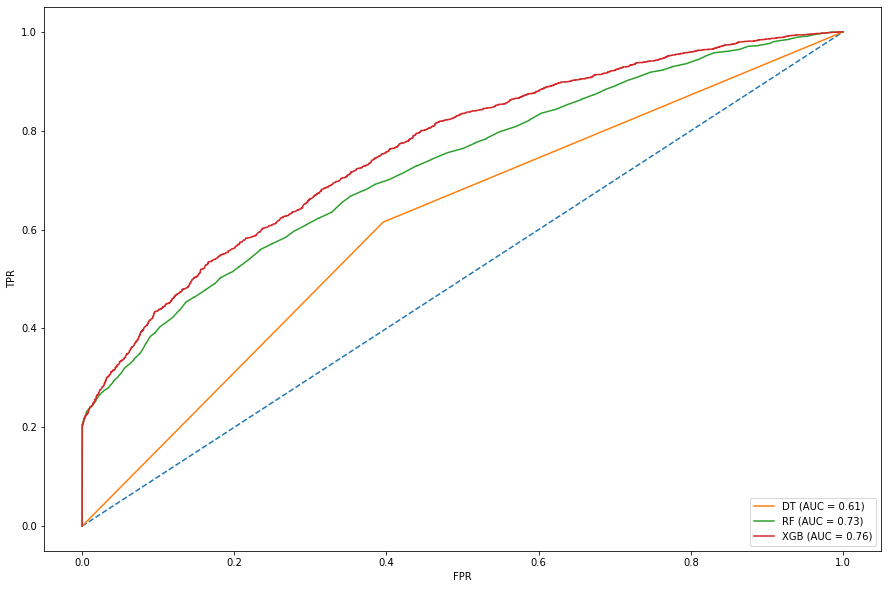

In [ ]:
# calculate scores
auc_dt = roc_auc_score(y_valid, pred_dt)
auc_rf = roc_auc_score(y_test, pred_rf)
auc_xgb = roc_auc_score(y_test, pred_xgb)

# calculate roc curves
fpr_dt, tpr_dt, _ = roc_curve(y_valid, pred_dt)
fpr_rf, tpr_rf, _ = roc_curve(y_test, pred_rf)
fpr_xgb, tpr_xgb, _ = roc_curve(y_test, pred_xgb)


plt.figure(figsize=(15, 10))
# plot horizontal line 
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr_dt, tpr_dt, label='DT (AUC = %0.2f)' % auc_dt)
plt.plot(fpr_rf, tpr_rf, label='RF (AUC = %0.2f)' % auc_rf)
plt.plot(fpr_xgb, tpr_xgb, label='XGB (AUC = %0.2f)' % auc_xgb)


# axis labels
plt.xlabel('FPR')
plt.ylabel('TPR')
# show the legend
plt.legend(loc='lower right')
# show the plot
plt.show()